# Importing Useful Libraries

In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
%matplotlib inline

In [2]:
import tensorflow
print (tensorflow.__version__)

2.3.0


In [3]:
# Globals
dim = 200   # dimensions
epochs = 50
batch_size = 200
steps = 5
noise_size = dim

# Download and Unzip dataset

In [4]:
import glob
#files = glob.glob('./content/100k/100k/*.jpg')
files = glob.glob('./content/100k/img_align_celeba/*.jpg')
files = files[:10000]
len(files)

10000

# Data Preparation and Normalization

In [5]:
import tqdm
from tqdm import notebook

images = []
for file in tqdm.notebook.tqdm(files):
    celeb_img = cv2.imread(file)
    celeb_img = cv2.cvtColor(celeb_img, cv2.COLOR_BGR2RGB)
    celeb_img = cv2.resize(celeb_img, (100, 100))
    images.append((celeb_img-127.5)/127.5)

images = np.array(images)
print (images.shape)

  0%|          | 0/10000 [00:00<?, ?it/s]

(10000, 100, 100, 3)


# Define Generator Model

In [6]:
random_input = tensorflow.keras.layers.Input(shape = dim)

x = tensorflow.keras.layers.Dense(64 * 7 * 7)(random_input)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Reshape((7, 7, 64))(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), strides=(2,2), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), strides=(2,2), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), strides=(2,2), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)

x = tensorflow.keras.layers.Conv2D(filters=3, kernel_size=(3,3), padding='same')(x)
generated_image = tensorflow.keras.layers.Activation('tanh')(x)

generator_network = tensorflow.keras.models.Model(inputs=random_input, outputs=generated_image)
generator_network.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200)]             0         
_________________________________________________________________
dense (Dense)                (None, 3136)              630336    
_________________________________________________________________
activation (Activation)      (None, 3136)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 3136)              12544     
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 14, 14, 128)       204928    
_________________________________________________________________
activation_1 (Activation)    (None, 14, 14, 128)      

# Define Discriminator

In [7]:
image_input = tensorflow.keras.layers.Input(shape=(56, 56, 3))

x = tensorflow.keras.layers.Conv2D(filters=128, kernel_size=(5,5), strides=2, padding='same')(image_input)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(5,5), strides=2, padding='same')(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=128, kernel_size=(5,5), strides=2, padding='same')(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(5,5), padding='same')(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=128, kernel_size=(5,5))(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(3,3))(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Flatten()(x)

x = tensorflow.keras.layers.Dense(1)(x)
real_vs_fake_output = tensorflow.keras.layers.Activation('sigmoid')(x)

discriminator_network = tensorflow.keras.models.Model(inputs=image_input, outputs=real_vs_fake_output)
discriminator_network.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 56, 56, 3)]       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 128)       9728      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 28, 28, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 64)        204864    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 14, 14, 64)        256       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 7, 7, 128)        

In [8]:
adam_optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_network.compile(loss='binary_crossentropy', optimizer=adam_optimizer, metrics=['accuracy'])

# Define combined model: DCGAN

In [9]:
discriminator_network.trainable=False

g_output = generator_network(random_input)
d_output = discriminator_network(g_output)

dcgan_model = tensorflow.keras.models.Model(random_input, d_output)
dcgan_model.summary()

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200)]             0         
_________________________________________________________________
functional_1 (Functional)    (None, 56, 56, 3)         2081987   
_________________________________________________________________
functional_3 (Functional)    (None, 1)                 904961    
Total params: 2,986,948
Trainable params: 2,074,947
Non-trainable params: 912,001
_________________________________________________________________


# Compiling Models

In [10]:
dcgan_model.compile(loss='binary_crossentropy', optimizer=adam_optimizer)

# Define Data Generators

In [11]:
def get_random_noise(batch_size, noise_size):
    random_values = np.random.randn(batch_size*noise_size)
    random_noise_batch = np.reshape(random_values, (batch_size, noise_size))
    return random_noise_batch

def get_fake_samples(generator_network, batch_size, noise_size):
    random_noise_batch = get_random_noise(batch_size, noise_size) 
    fake_samples = generator_network.predict_on_batch(random_noise_batch)
    return fake_samples

def get_real_samples(batch_size):
    random_files = np.random.choice(files, size=batch_size)
    images = []
    for file in random_files:
        celeb_img = cv2.imread(file)
        celeb_img = cv2.cvtColor(celeb_img, cv2.COLOR_BGR2RGB)
        celeb_img = cv2.resize(celeb_img, (56, 56))
        images.append((celeb_img-127.5)/127.5)
    real_images = np.array(images)
    return real_images

def show_generator_results(generator_network):
    for k in range(9):
        plt.figure(figsize=(11, 11))
        fake_samples = get_fake_samples(generator_network, 9, noise_size)
        fake_samples = (fake_samples+1.0)/2.0
        for j in range(9):
            plt.subplot(990 + 1 + j)
            plt.imshow(fake_samples[j])
            plt.axis('off')
            #plt.title(trainY[i])
        plt.show()
    return

# Training DCGAN on Celeb Faces

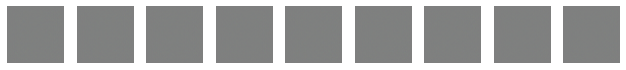

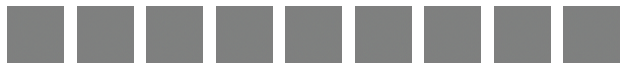

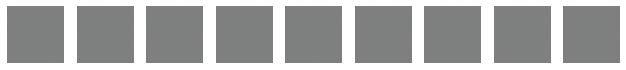

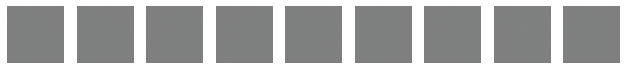

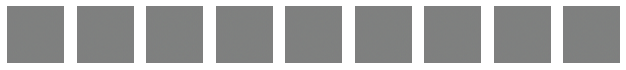

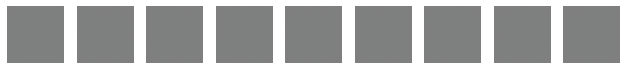

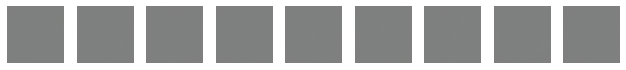

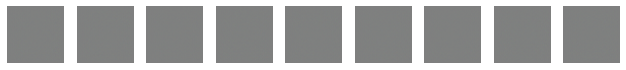

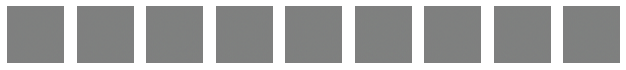

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: ./content/celeb_model_0\assets
Epoch:0, Step:0, D-Loss:0.733, D-Acc:76.000, G-Loss:0.748
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:1, Step:0, D-Loss:0.009, D-Acc:100.000, G-Loss:0.733
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:2, Step:0, D-Loss:0.008, D-Acc:99.500, G-Loss:0.046
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:3, Step:0, D-Loss:0.005, D-Acc:100.000, G-Loss:0.001
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:4, Step:0, D-Loss:0.039, D-Acc:100.000, G-Loss:5.491
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


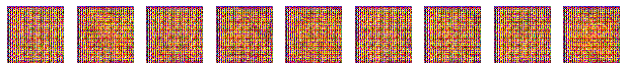

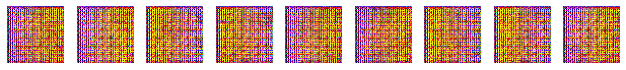

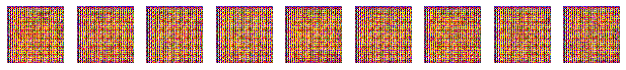

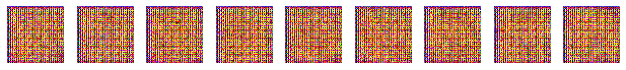

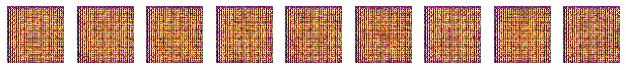

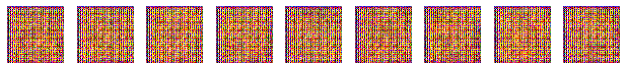

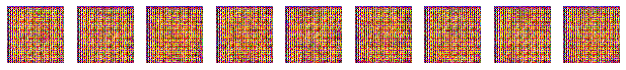

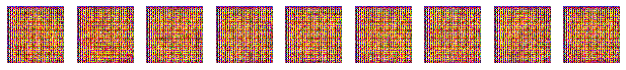

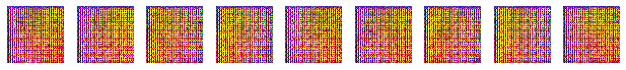

INFO:tensorflow:Assets written to: ./content/celeb_model_5\assets
Epoch:5, Step:0, D-Loss:0.006, D-Acc:100.000, G-Loss:12.154
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:6, Step:0, D-Loss:0.008, D-Acc:100.000, G-Loss:9.216
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:7, Step:0, D-Loss:0.003, D-Acc:100.000, G-Loss:15.595
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:8, Step:0, D-Loss:0.474, D-Acc:84.000, G-Loss:17.054
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:9, Step:0, D-Loss:0.009, D-Acc:100.000, G-Loss:8.916
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


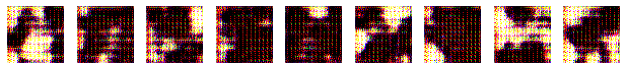

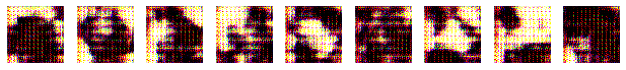

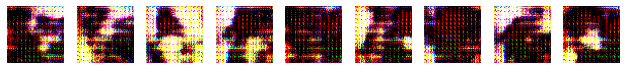

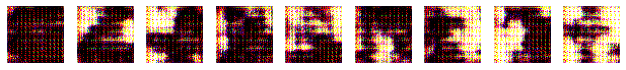

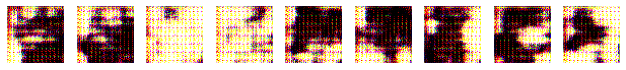

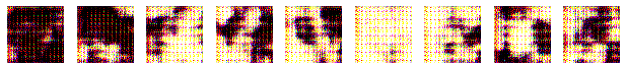

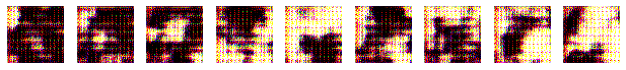

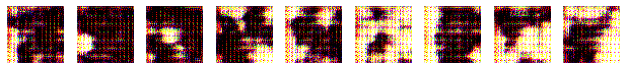

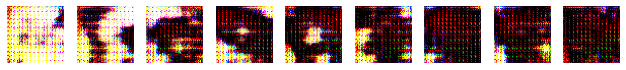

INFO:tensorflow:Assets written to: ./content/celeb_model_10\assets
Epoch:10, Step:0, D-Loss:0.022, D-Acc:99.000, G-Loss:6.796
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:11, Step:0, D-Loss:0.010, D-Acc:99.500, G-Loss:7.807
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:12, Step:0, D-Loss:0.007, D-Acc:100.000, G-Loss:6.610
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:13, Step:0, D-Loss:0.012, D-Acc:100.000, G-Loss:7.271
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:14, Step:0, D-Loss:0.009, D-Acc:100.000, G-Loss:8.555
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


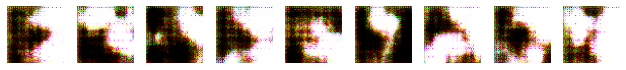

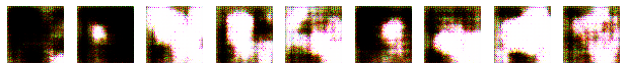

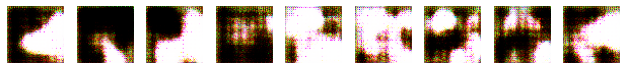

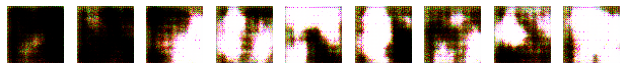

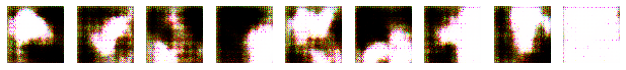

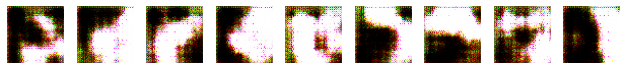

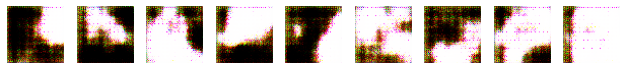

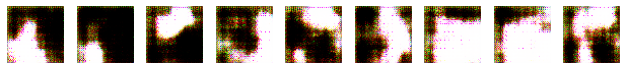

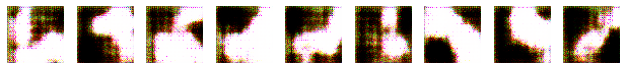

INFO:tensorflow:Assets written to: ./content/celeb_model_15\assets
Epoch:15, Step:0, D-Loss:0.020, D-Acc:99.500, G-Loss:9.737
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:16, Step:0, D-Loss:0.103, D-Acc:96.500, G-Loss:1.868
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:17, Step:0, D-Loss:0.093, D-Acc:96.500, G-Loss:4.657
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:18, Step:0, D-Loss:0.040, D-Acc:99.000, G-Loss:5.310
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:19, Step:0, D-Loss:0.096, D-Acc:96.000, G-Loss:5.519
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


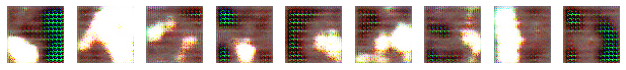

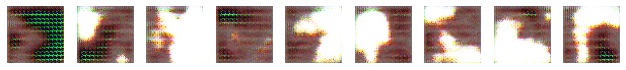

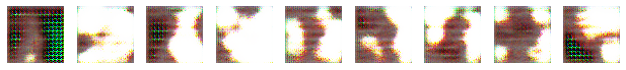

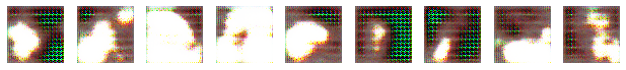

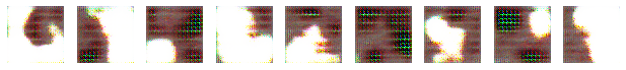

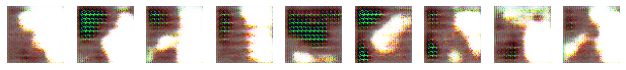

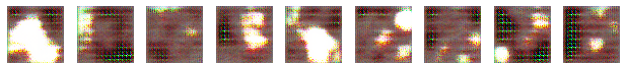

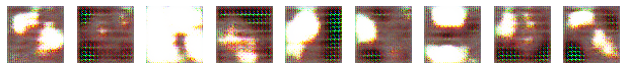

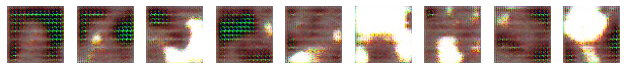

INFO:tensorflow:Assets written to: ./content/celeb_model_20\assets
Epoch:20, Step:0, D-Loss:0.087, D-Acc:98.000, G-Loss:7.215
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:21, Step:0, D-Loss:0.106, D-Acc:95.500, G-Loss:5.030
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:22, Step:0, D-Loss:0.171, D-Acc:92.500, G-Loss:5.640
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:23, Step:0, D-Loss:0.140, D-Acc:96.000, G-Loss:9.107
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:24, Step:0, D-Loss:0.144, D-Acc:93.000, G-Loss:7.740
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


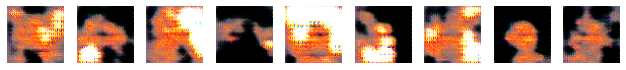

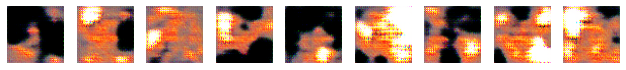

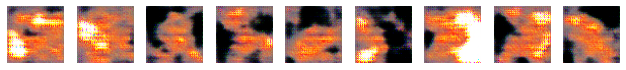

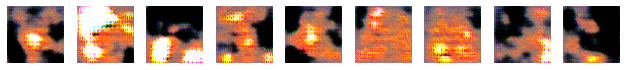

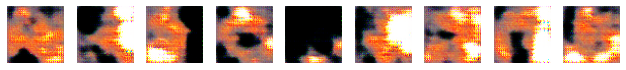

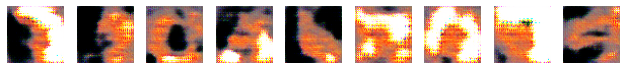

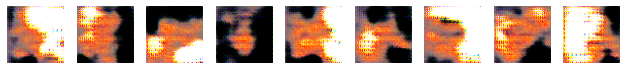

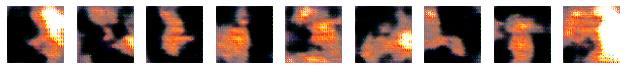

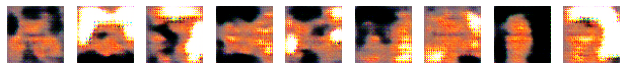

INFO:tensorflow:Assets written to: ./content/celeb_model_25\assets
Epoch:25, Step:0, D-Loss:0.148, D-Acc:93.000, G-Loss:8.356
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:26, Step:0, D-Loss:0.211, D-Acc:92.000, G-Loss:3.243
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:27, Step:0, D-Loss:0.247, D-Acc:94.000, G-Loss:6.962
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:28, Step:0, D-Loss:0.136, D-Acc:94.500, G-Loss:4.554
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:29, Step:0, D-Loss:0.222, D-Acc:90.000, G-Loss:6.427
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


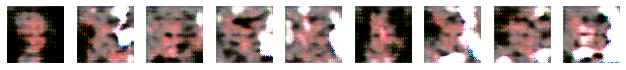

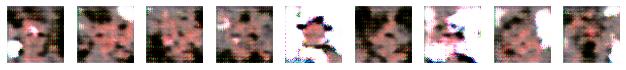

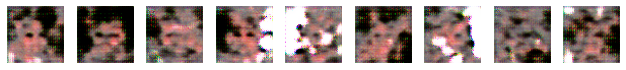

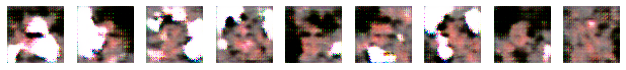

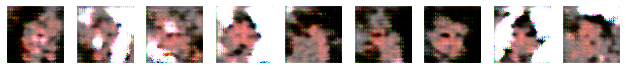

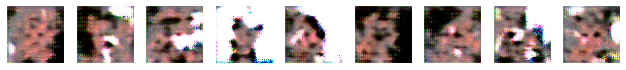

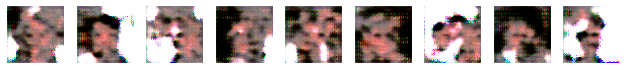

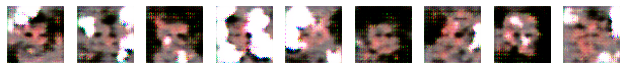

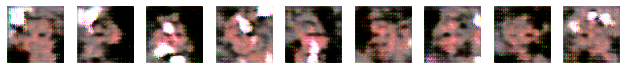

INFO:tensorflow:Assets written to: ./content/celeb_model_30\assets
Epoch:30, Step:0, D-Loss:0.243, D-Acc:90.000, G-Loss:4.086
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:31, Step:0, D-Loss:0.283, D-Acc:91.500, G-Loss:5.441
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:32, Step:0, D-Loss:0.333, D-Acc:84.000, G-Loss:5.527
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:33, Step:0, D-Loss:0.322, D-Acc:87.500, G-Loss:6.065
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:34, Step:0, D-Loss:0.135, D-Acc:94.500, G-Loss:4.051
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


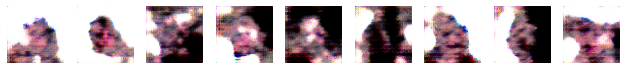

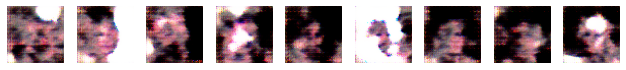

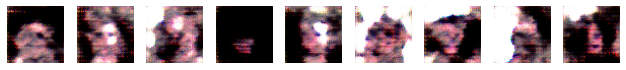

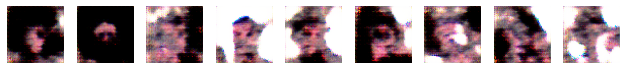

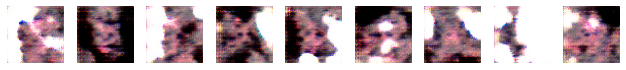

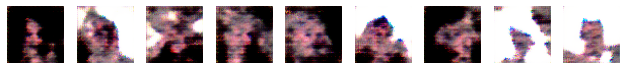

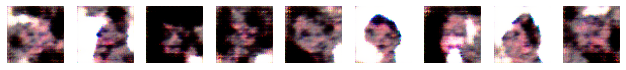

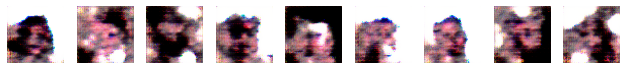

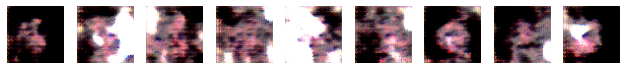

INFO:tensorflow:Assets written to: ./content/celeb_model_35\assets
Epoch:35, Step:0, D-Loss:0.195, D-Acc:93.500, G-Loss:3.633
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:36, Step:0, D-Loss:0.380, D-Acc:87.000, G-Loss:3.360
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:37, Step:0, D-Loss:0.207, D-Acc:92.000, G-Loss:6.072
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:38, Step:0, D-Loss:0.155, D-Acc:94.500, G-Loss:5.213
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:39, Step:0, D-Loss:0.263, D-Acc:88.500, G-Loss:2.841
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


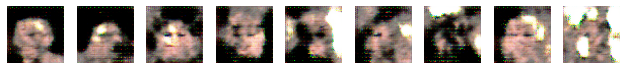

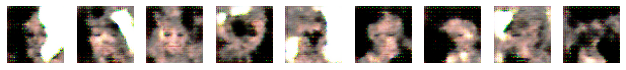

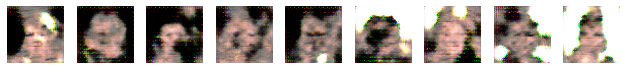

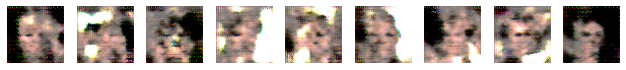

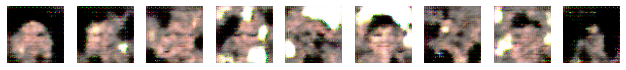

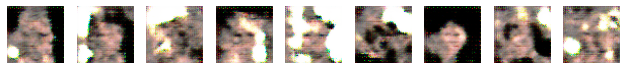

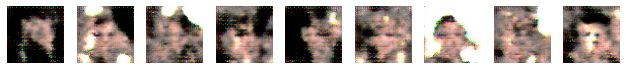

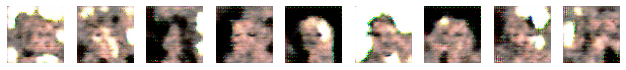

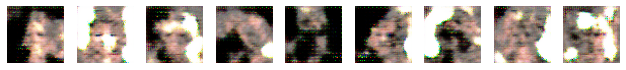

INFO:tensorflow:Assets written to: ./content/celeb_model_40\assets
Epoch:40, Step:0, D-Loss:0.214, D-Acc:93.000, G-Loss:2.514
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:41, Step:0, D-Loss:0.183, D-Acc:93.500, G-Loss:3.963
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:42, Step:0, D-Loss:0.168, D-Acc:93.000, G-Loss:2.708
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:43, Step:0, D-Loss:0.438, D-Acc:84.000, G-Loss:4.837
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:44, Step:0, D-Loss:0.295, D-Acc:87.500, G-Loss:3.484
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


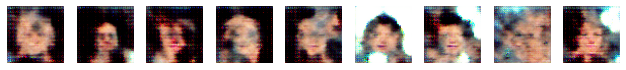

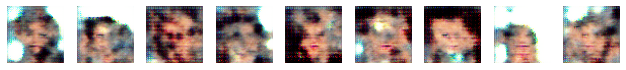

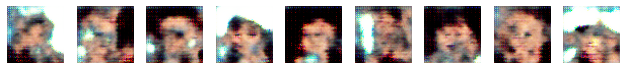

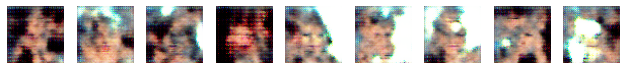

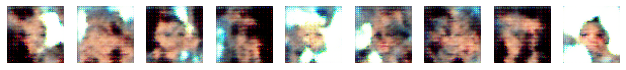

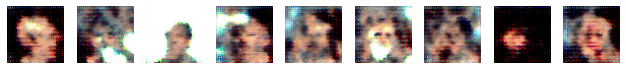

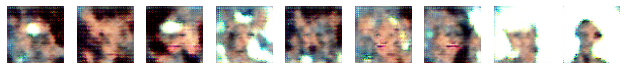

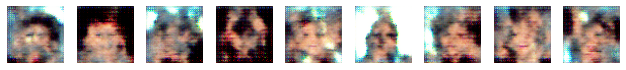

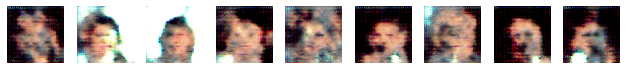

INFO:tensorflow:Assets written to: ./content/celeb_model_45\assets
Epoch:45, Step:0, D-Loss:0.240, D-Acc:89.500, G-Loss:3.228
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:46, Step:0, D-Loss:0.332, D-Acc:87.000, G-Loss:2.261
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:47, Step:0, D-Loss:0.252, D-Acc:89.500, G-Loss:5.925
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:48, Step:0, D-Loss:0.195, D-Acc:93.000, G-Loss:3.180
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:49, Step:0, D-Loss:0.219, D-Acc:92.000, G-Loss:3.240
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


In [12]:
#epochs = 2
#batch_size = 10
#steps = 5
#noise_size = dim

for i in range(0, epochs):
    if (i%5 == 0):
        show_generator_results(generator_network)
        generator_network.save('./content/celeb_model_'+ str(i))
    for j in range(steps):
        fake_samples = get_fake_samples(generator_network, batch_size//2, noise_size)
        real_samples = get_real_samples(batch_size=batch_size//2)

        fake_y = np.zeros((batch_size//2, 1))
        real_y = np.ones((batch_size//2, 1))
        
        input_batch = np.vstack((fake_samples, real_samples))
        output_labels = np.vstack((fake_y, real_y))
        # Updating Discriminator weights
        discriminator_network.trainable=True
        loss_d = discriminator_network.train_on_batch(input_batch, output_labels)
        
        gan_input = get_random_noise(batch_size, noise_size)
        
        # Make the Discriminator belive that these are real samples and calculate loss to train the generator
        gan_output = np.ones((batch_size))
        
        # Updating Generator weights
        discriminator_network.trainable=False
        loss_g = dcgan_model.train_on_batch(gan_input, gan_output)
        
        if j%50 == 0:
            print ("Epoch:%.0f, Step:%.0f, D-Loss:%.3f, D-Acc:%.3f, G-Loss:%.3f"%(i,j,loss_d[0],loss_d[1]*100,loss_g))
    generator_network.save('./content/celeb_model_new')
            

# Show Results

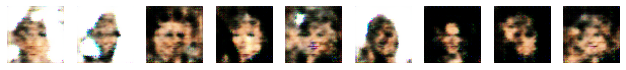

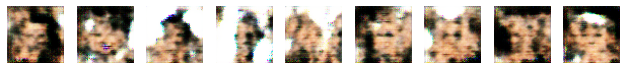

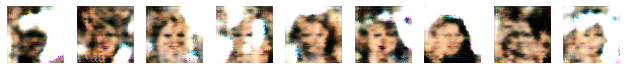

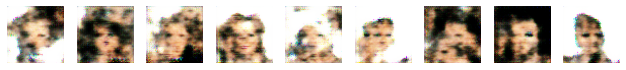

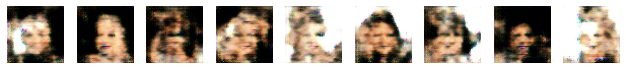

...

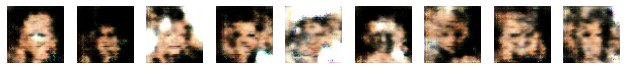

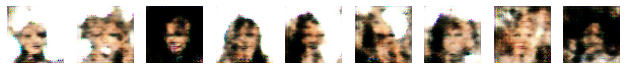

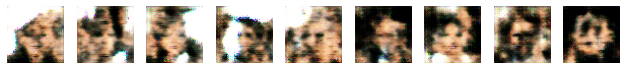

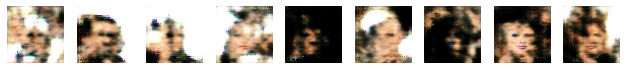

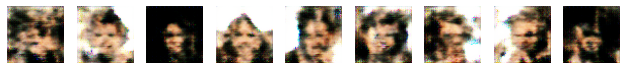

In [13]:
#Generating Unlimited samples
noise_size=dim
generator_network = tensorflow.keras.models.load_model('./content/celeb_model_new')
for i in range(5):
    show_generator_results(generator_network)